# Preprocessing the Data for PCA

In [2]:
# Initial imports
import pandas as pd
import hvplot.pandas
import seaborn as sns
# from path import Path
import plotly.express as px
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [3]:
# Load the customer merged dataset
file_path = "data/Customer_data_merged.csv"
data_df = pd.read_csv(file_path)
data_df.columns

Index(['CustomerID', 'ZipCode', 'State', 'ArticCat_Tot', 'Bobcat_Tot',
       'Can-Am_Tot', 'Honda_Tot', 'John-Deere_Tot', 'Kawasaki_Tot',
       'Kubota_Tot', 'Other-Brand_Tot', 'Polaris_Tot', 'Suzuki_Tot',
       'Yamaha_Tot', 'LOB_Misc_Tot', 'LOB_NOS-Rebuilt-Part_Tot',
       'LOB_Rebuilt-Engines-Tot', 'LOB_Salvage_Tot', 'Mkt-Counter_Tot',
       'Mkt-Other_Tot', 'Mkt-Website_Tot', 'Mkt-eBay_Tot', 'Recency',
       'Frequency', 'Monetary', 'R', 'F', 'M', 'RFM Score', 'Segment', 'lat',
       'lng', 'city', 'state_id', 'state_name', 'zcta', 'population',
       'density', 'county_fips'],
      dtype='object')

In [4]:
new_data_df = data_df[['ArticCat_Tot', 'Bobcat_Tot', 'Can-Am_Tot', 'Honda_Tot', 'John-Deere_Tot', 'Kawasaki_Tot', 'Kubota_Tot', 'Other-Brand_Tot', 'Polaris_Tot', 'Suzuki_Tot', 'Yamaha_Tot','Recency','Frequency', 'Monetary','Mkt-Website_Tot','Mkt-eBay_Tot']]

new_data_df

,ArticCat_Tot,Bobcat_Tot,Can-Am_Tot,Honda_Tot,John-Deere_Tot,Kawasaki_Tot,Kubota_Tot,Other-Brand_Tot,Polaris_Tot,Suzuki_Tot,Yamaha_Tot,Recency,Frequency,Monetary,Mkt-Website_Tot,Mkt-eBay_Tot
0,0.00,0.0,121.98,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,636,3,121.98,0.00,121.98
1,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,34.99,754,0,0.00,0.00,34.99
2,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,29.99,0.00,0.00,731,0,0.00,0.00,29.99
3,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,38.99,0.00,0.00,613,1,38.99,0.00,38.99
4,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,25.99,0.00,0.00,500,1,25.99,25.99,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140528,0.00,0.0,0.00,58.99,0.0,0.0,0.0,0.0,0.00,0.00,0.00,2,1,58.99,0.00,58.99
140529,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,145.99,0.00,0.00,2,1,145.99,0.00,145.99
140530,74.94,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,2,1,74.94,0.00,74.94
140531,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,79.95,0.00,0.00,1,1,79.95,0.00,79.95


In [5]:
data_df_scaled = MinMaxScaler().fit_transform(new_data_df)
data_df_scaled

array([[0.00000000e+00, 0.00000000e+00, 1.64575407e-02, ...,
        7.09007105e-04, 0.00000000e+00, 4.86950190e-03],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 1.39681810e-03],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 1.19721563e-03],
       ...,
       [9.30599898e-03, 0.00000000e+00, 0.00000000e+00, ...,
        4.35587739e-04, 0.00000000e+00, 2.99164185e-03],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        4.64708297e-04, 0.00000000e+00, 3.19164352e-03],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        9.87541458e-05, 0.00000000e+00, 6.78249199e-04]])

In [7]:
sse = {}
K = range(1, 200)
for k in K:
    kmeanmodel = KMeans(n_clusters=k).fit(data_df_scaled)
    sse[str(k)]= kmeanmodel.inertia_
# print(sse)    

# Plot
elbow_curve_df = pd.DataFrame({"k":sse.keys(), "inertia":sse.values()})
elbow_curve_df.hvplot.line(x="k", y="inertia")

:Curve   [k]   (inertia)

In [8]:
sse = {}
K = range(1, 50)
for k in K:
    kmeanmodel = KMeans(n_clusters=k).fit(data_df_scaled)
    sse[str(k)]= kmeanmodel.inertia_
# print(sse)    

# Plot
elbow_curve_df = pd.DataFrame({"k":sse.keys(), "inertia":sse.values()})
elbow_curve_df.hvplot.line(x="k", y="inertia")

:Curve   [k]   (inertia)

In [9]:
# Create KMeans model with 2 clusters
model = KMeans(n_clusters=4, random_state=0).fit(data_df_scaled)

In [10]:
# Calculate predicted values
y_pred = model.predict(data_df_scaled)
y_pred

array([1, 1, 1, ..., 2, 2, 2], dtype=int32)

In [13]:
data_df_scaled = pd.DataFrame(data_df_scaled, columns = ['ArticCat_Tot', 'Bobcat_Tot', 'Can-Am_Tot', 'Honda_Tot', 'John-Deere_Tot', 'Kawasaki_Tot', 'Kubota_Tot', 'Other-Brand_Tot', 'Polaris_Tot', 'Suzuki_Tot', 'Yamaha_Tot','Recency','Frequency', 'Monetary','Mkt-Website_Tot','Mkt-eBay_Tot'])

In [14]:
data_df_scaled['predictions'] = y_pred.tolist()

In [15]:
data_df_scaled.head(10)

,ArticCat_Tot,Bobcat_Tot,Can-Am_Tot,Honda_Tot,John-Deere_Tot,Kawasaki_Tot,Kubota_Tot,Other-Brand_Tot,Polaris_Tot,Suzuki_Tot,Yamaha_Tot,Recency,Frequency,Monetary,Mkt-Website_Tot,Mkt-eBay_Tot,predictions
0,0.0,0.0,0.016458,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.841060,0.007246,0.000709,0.000000,0.004870,1
1,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.001491,0.997351,0.000000,0.000000,0.000000,0.001397,1
2,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000169,0.000000,0.000000,0.966887,0.000000,0.000000,0.000000,0.001197,1
3,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000220,0.000000,0.000000,0.810596,0.002415,0.000227,0.000000,0.001557,1
4,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000146,0.000000,0.000000,0.660927,0.002415,0.000151,0.000149,0.000000,3
5,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.005171,0.000000,0.054305,0.002415,0.000174,0.000000,0.001197,2
6,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.002045,0.039735,0.002415,0.000279,0.000000,0.001915,2
7,0.0,0.0,0.079734,0.006179,0.0,0.0,0.0,0.0,0.002269,0.000000,0.000807,0.064901,0.026570,0.006699,0.006616,0.000000,2
8,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000197,0.000000,0.000000,0.733775,0.002415,0.000203,0.000201,0.000000,3
9,0.0,0.0,0.000000,0.004413,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.132450,0.002415,0.000581,0.000574,0.000000,2


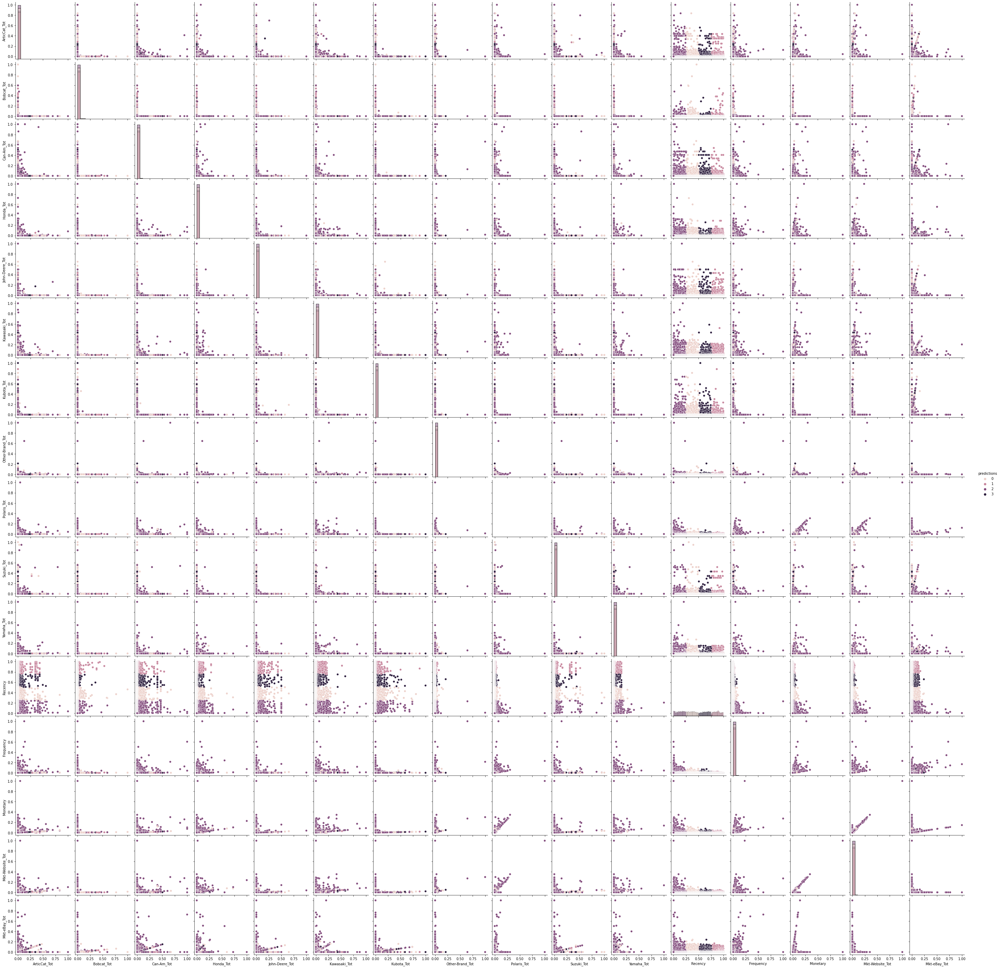

In [16]:
sns.pairplot(data_df_scaled, hue="predictions", diag_kind="hist")

In [17]:
model2 = KMeans(n_clusters=3, random_state=0).fit(data_df_scaled)

In [18]:
y_pred = model2.predict(data_df_scaled)
y_pred

array([0, 0, 0, ..., 2, 2, 2], dtype=int32)

In [19]:
data_df_scaled['predictions'] = y_pred.tolist()

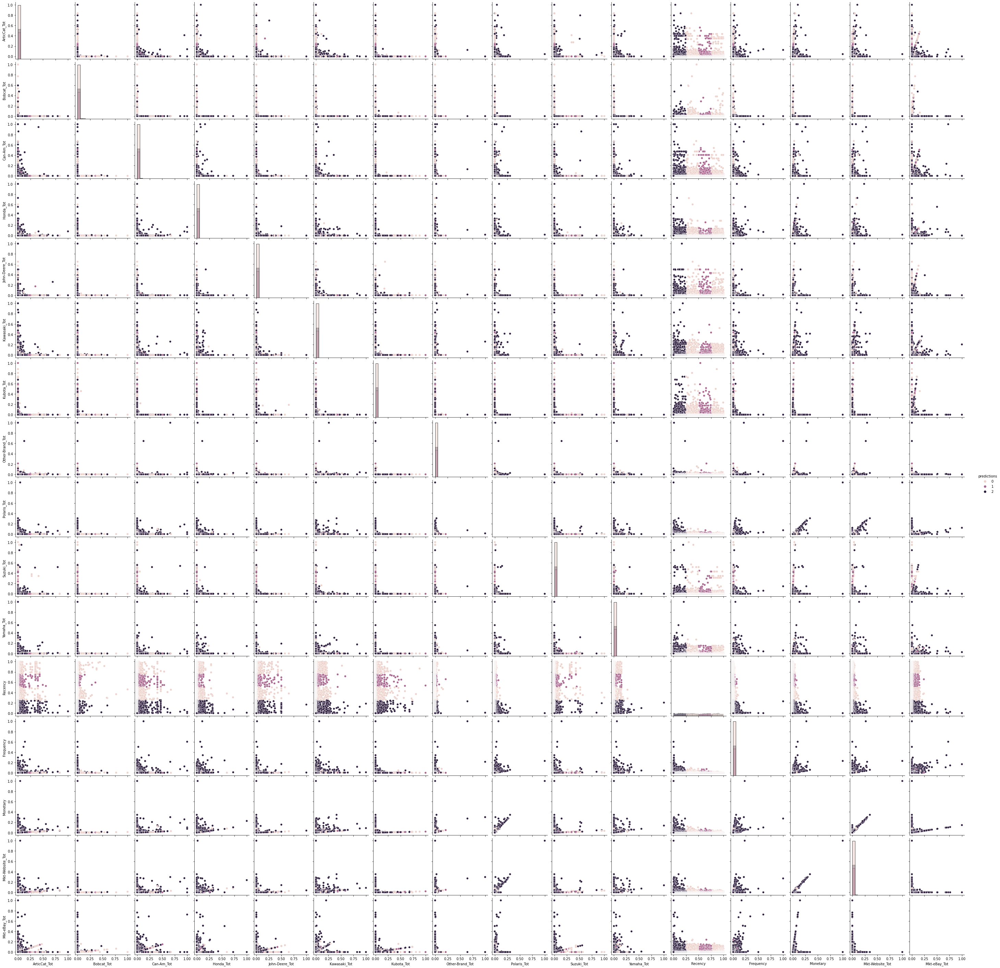

In [20]:
sns.pairplot(data_df_scaled, hue="predictions", diag_kind="hist")